In [1]:
from pylab import imread, imshow, gray, mean

In [2]:
ori = imread('Hue_ROI2.tif')

In [3]:
print(type(ori))

<class 'numpy.ndarray'>


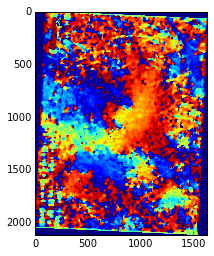

In [4]:
%matplotlib inline
imshow(ori)


In [5]:
print(ori.shape)

(2116, 1628)


In [6]:
ori[1700][500]

245

In [7]:
import numpy as np


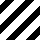
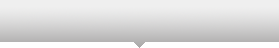
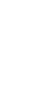
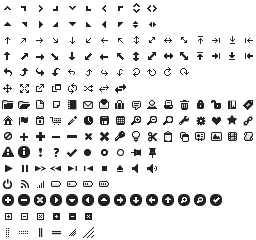
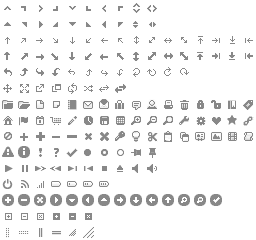
...
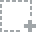
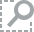
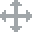
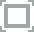
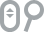

In [8]:
from __future__ import division
from bokeh.plotting import *
output_notebook()

In [9]:
a = np.ones([10, 10])[::2].T[::2]
a

array([[ 1.,  1.,  1.,  1.,  1.],
       [ 1.,  1.,  1.,  1.,  1.],
       [ 1.,  1.,  1.,  1.,  1.],
       [ 1.,  1.,  1.,  1.,  1.],
       [ 1.,  1.,  1.,  1.,  1.]])

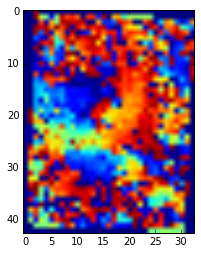

In [33]:
#takes every 40th point from the image on each axis
oriComp = ori[::50].T[::50].T
imshow(oriComp)

In [34]:
len(ori.T)

1628

In [35]:
len(oriComp.T)

33

In [36]:
#converts image intensity to radians and converts to 1D array
angRad = oriComp*2*np.pi/255
angRadLine = np.reshape(angRad, angRad.size)

In [37]:
angRadLine.shape

(1419,)

In [38]:
#Generates x and y coords to plot each line
xsize = len(oriComp)
ysize = len(oriComp.T)
xy = np.indices((xsize, ysize))
x = np.reshape(xy[1], xy[1].size)
x.size
y = np.reshape(xy[0], xy[0].size)
y

array([ 0,  0,  0, ..., 42, 42, 42])

In [42]:
points = y.size
# Length of rods relative to total sim area (2x2 units)
ntsize = 0.5

# Calculate line enpoints for each particle
x1 = x - ntsize * np.cos(angRadLine)
x2 = x + ntsize * np.cos(angRadLine)
y1 = y - ntsize * np.sin(angRadLine)
y2 = y + ntsize * np.sin(angRadLine)

# Make 2D arrays. Each 1D array is point 1 and 2
xtot = np.column_stack((x1, x2))
ytot = np.column_stack((y1, y2))

# Plot each set of particles
p = figure()
p.image(image = [ori], x = [0], y = [0], dw = [ysize], dh = [xsize])
for point in range(points):
    p.line(xtot[point],ytot[point])
    #p.hold()
show(p)

In [40]:
#p2 = figure(x_range = [0, 1], y_range = [0, 1])
#p2.image(image = [ori], x = [0], y = [0], dw = [1], dh = [1])
#show(p2)